<a href="https://colab.research.google.com/github/nannthd/project_AIEngineer/blob/main/coconut_yolov5m.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Install Dependencies


In [ ]:
!pip install roboflow

In [ ]:
import roboflow
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt roboflow #install dependencies

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 16413, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 16413 (delta 0), reused 3 (delta 0), pack-reused 16408
Receiving objects: 100% (16413/16413), 14.90 MiB | 26.76 MiB/s, done.
Resolving deltas: 100% (11265/11265), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.4/196.4 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 710.2/710.2 kB 10.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.0 MB/s eta 0:00:00
Setup complete. Using torch 2.1.0+cu121 (_CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15102MB, multi_processor_count=40))


#Download Custom Dataset

In [ ]:
%cd /content/yolov5
#after following the link above, recieve python code with these fields filled in
#from roboflow import Roboflow
#rf = Roboflow(api_key="YOUR API KEY HERE")
#project = rf.workspace().project("YOUR PROJECT")
#dataset = project.version("YOUR VERSION").download("yolov5")

/content/yolov5


In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="GoDp7WoW8c50tAsVTs4e")
project = rf.workspace("kku-o5mso").project("chromosome-v.2")
dataset = project.version(2).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Chromosome-v.2-2 in yolov5pytorch:: 100%|██████████| 300/300 [00:00<00:00, 3214.84it/s]


In [ ]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat {dataset.location}/data.yaml

names:
- chromosome
nc: 1
roboflow:
  license: CC BY 4.0
  project: chromosome-v.2
  url: https://universe.roboflow.com/kku-o5mso/chromosome-v.2/dataset/2
  version: 2
  workspace: kku-o5mso
test: ../test/images
train: Chromosome-v.2-2/train/images
val: Chromosome-v.2-2/valid/images


# Define Model Configuration and Architecture

In [ ]:
# define number of classes based on YAML
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
#this is the model configuration we will use for our tutorial
%cat /content/yolov5/models/yolov5m.yaml

# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license

# Parameters
nc: 80 # number of classes
depth_multiple: 0.67 # model depth multiple
width_multiple: 0.75 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5m.yaml

# Parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.67  # model depth multiple
width_multiple: 0.75  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Train Custom YOLOv5 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 640 --batch 16 --epochs 200 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5m.yaml --weights 'yolov5m.pt' --optimizer SGD --freeze 10 --image-weights --hyp ./data/hyps/hyp.scratch-high.yaml --name yolov5m_results  --cache

/content/yolov5
2024-02-14 05:30:29.810239: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-14 05:30:29.810294: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-14 05:30:29.812611: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5m.pt, cfg=./models/custom_yolov5m.yaml, data=/content/yolov5/Chromosome-v.2-2/data.yaml, hyp=./data/hyps/hyp.scratch-high.yaml, epochs=200, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cac

# Evaluate Custom YOLOv5 Detector Performance

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

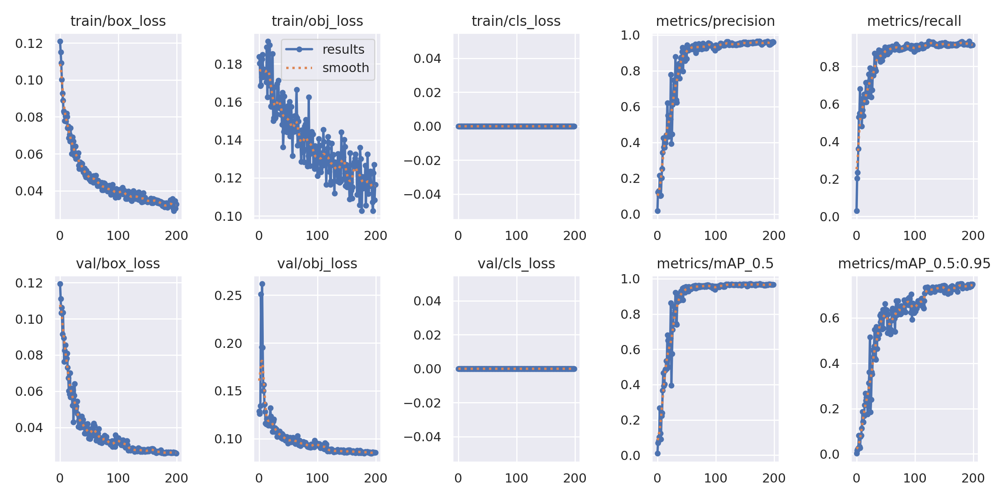

In [ ]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason...
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5m_results/results.png', width=1000)  # view results.png

##Visualize Our Training Data with Labels

GROUND TRUTH TRAINING DATA:


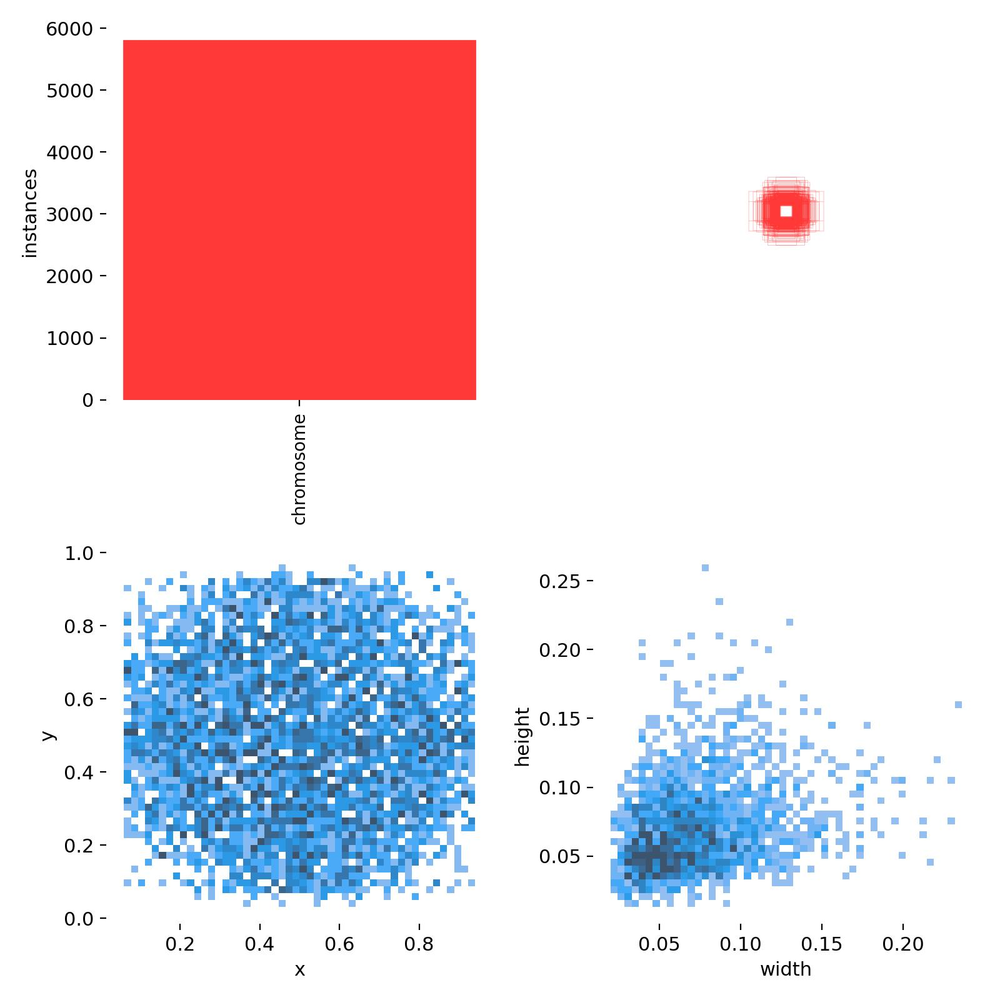

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5m_results/labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


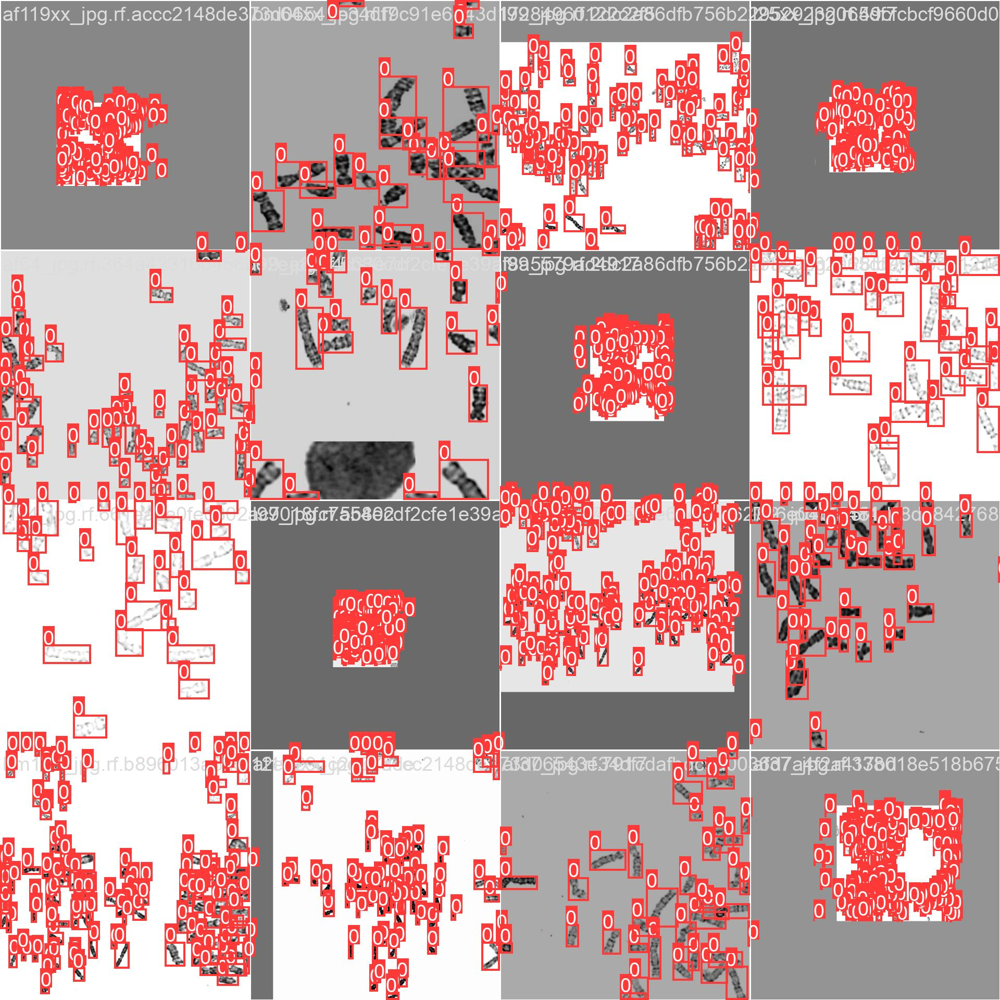

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5m_results/train_batch0.jpg', width=900)

#Run Inference  With Trained Weights

In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [ ]:
%ls runs/train/yolov5m_results/weights

best.pt  last.pt


In [ ]:
test_set_loc = dataset.location + "/test/images/"

In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5m_results/weights/best.pt --img 640 --conf 0.4 --source {test_set_loc}

/content/yolov5
detect: weights=['runs/train/yolov5m_results/weights/best.pt'], source=/content/yolov5/Chromosome-v.2-2/test/images/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-284-g95ebf68f Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5m summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/6 /content/yolov5/Chromosome-v.2-2/test/images/af183xx_jpg.rf.f568f8076e8c1dbf993125090ec0a76c.jpg: 640x640 48 chromosomes, 27.0ms
image 2/6 /content/yolov5/Chromosome-v.2-2/test/images/af195xx_jpg.rf.7017acbe6128cab

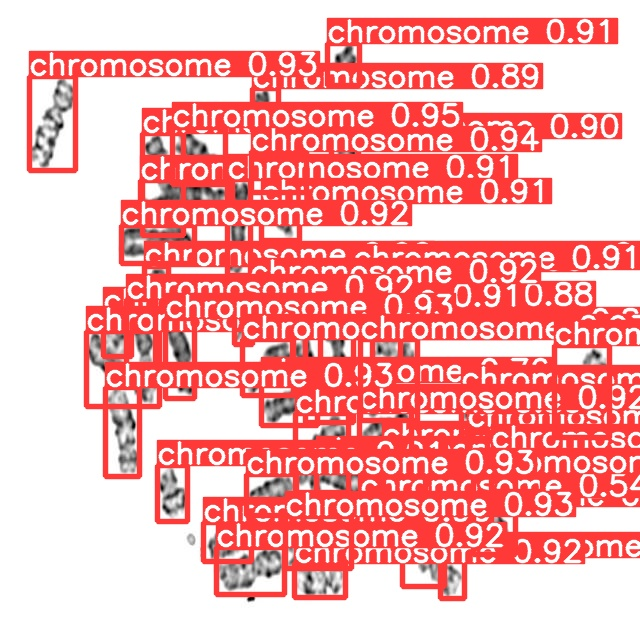

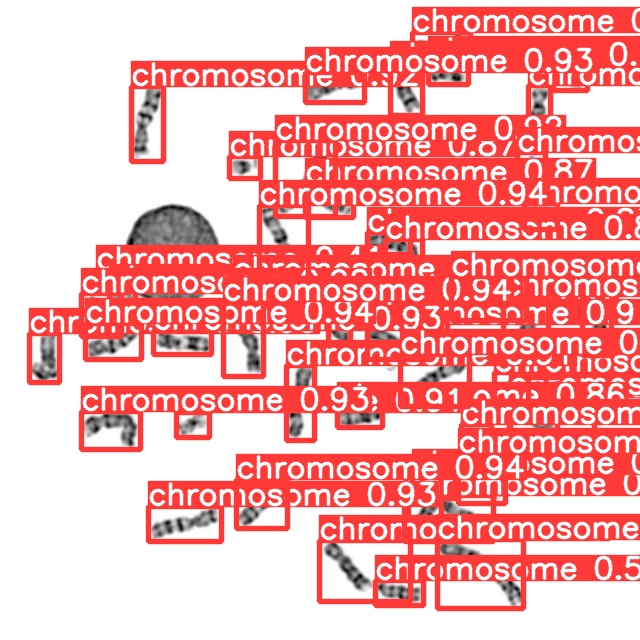

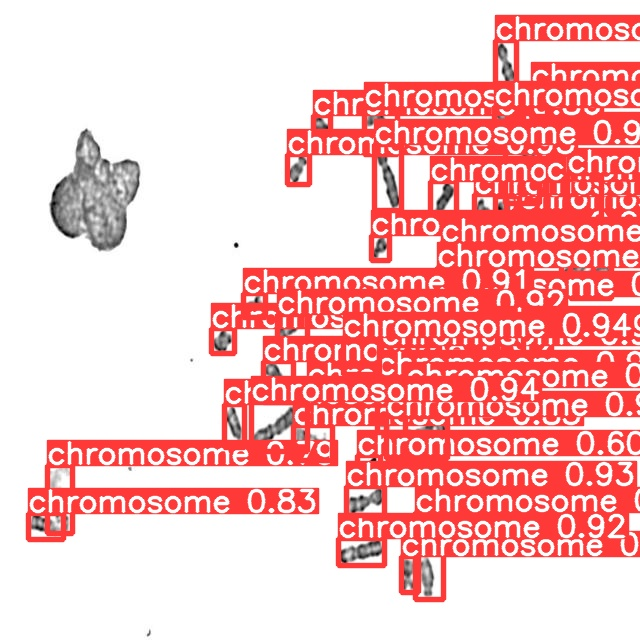

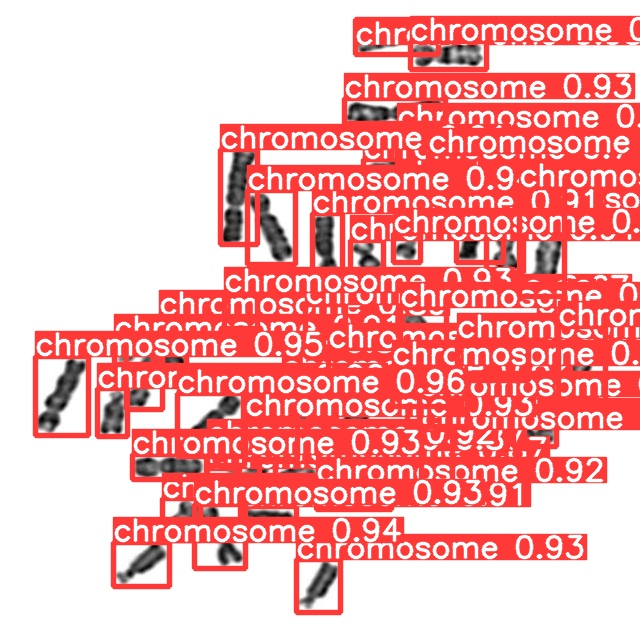

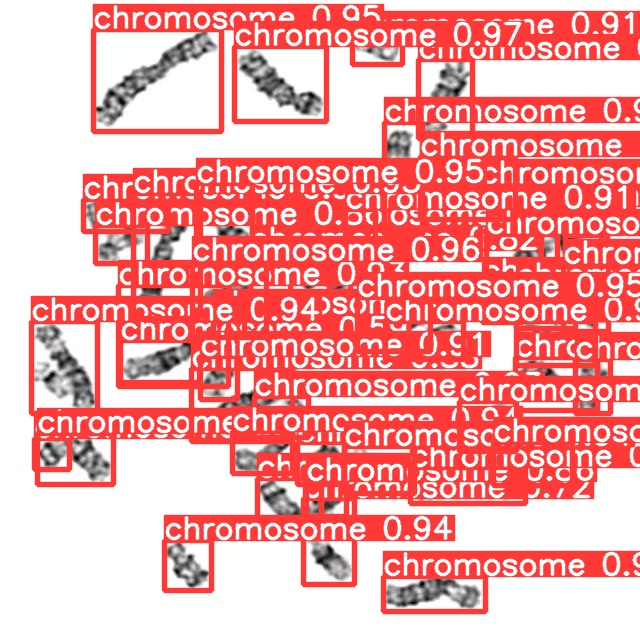

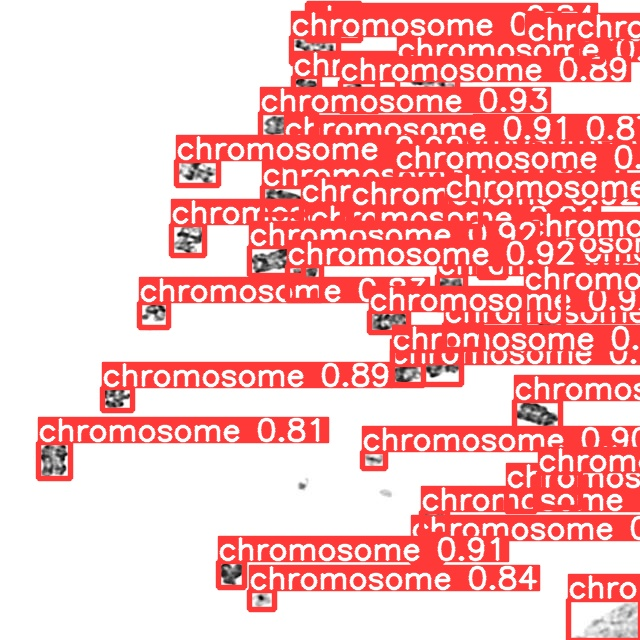

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Deploy Model Weights to Roboflow

In [ ]:
project.version(dataset.version).deploy(model_type="yolov5", model_path=f"/content/yolov5/runs/train/yolov5m_results/")

View the status of your deployment at: https://app.roboflow.com/kku-o5mso/chromosome-v.2/2
Share your model with the world at: https://universe.roboflow.com/kku-o5mso/chromosome-v.2/model/2


In [ ]:
#While your deployment is processing, checkout the deployment docs to take your model to most destinations https://docs.roboflow.com/inference

In [ ]:
#Run inference on your model on a persistant, auto-scaling, cloud API

#load model
model = project.version(dataset.version).model

#choose random test set image
import os, random
test_set_loc = dataset.location + "/test/images/"
random_test_image = random.choice(os.listdir(test_set_loc))
print("running inference on " + random_test_image)

running inference on bm118xx_jpg.rf.2984d928f0a6fb13a68e76a31d785ea7.jpg


In [ ]:
model.api_key = "rf_Jn6zV8UGLkXXacfPZXuW5AueMzO2"
pred = model.predict(test_set_loc + random_test_image, confidence=40, overlap=30).json()
pred

In [ ]:
model.api_key = "rf_Jn6zV8UGLkXXacfPZXuW5AueMzO2"

try:
    pred = model.predict(test_set_loc + random_test_image, confidence=40, overlap=30).json()
    print(pred)
except Exception as e:
    print(f"Error: {e}")

Error: 403 Client Error: Forbidden for url: https://detect.roboflow.com/chromosome-v.2/2?api_key=GoDp7WoW8c50tAsVTs4e&name=YOUR_IMAGE.jpg&overlap=30&confidence=40&stroke=1&labels=false&format=json


In [ ]:
try:
    pred = model.predict(test_set_loc + random_test_image, confidence=40, overlap=30).json()
    print(pred)
except Exception as e:
    print(f"Error: {e}")

{'predictions': [{'x': 279.0, 'y': 426.0, 'width': 56.0, 'height': 50.0, 'confidence': 0.9423466324806213, 'class': 'chromosome', 'class_id': 0, 'detection_id': '10b55596-118d-4d58-807a-f3ce93b0a66e', 'image_path': '/content/yolov5/Chromosome-v.2-2/test/images/bm118xx_jpg.rf.2984d928f0a6fb13a68e76a31d785ea7.jpg', 'prediction_type': 'ObjectDetectionModel'}, {'x': 361.0, 'y': 355.5, 'width': 36.0, 'height': 37.0, 'confidence': 0.9365196824073792, 'class': 'chromosome', 'class_id': 0, 'detection_id': 'd49a2ec1-0c2d-4e2f-880f-9abd6063475d', 'image_path': '/content/yolov5/Chromosome-v.2-2/test/images/bm118xx_jpg.rf.2984d928f0a6fb13a68e76a31d785ea7.jpg', 'prediction_type': 'ObjectDetectionModel'}, {'x': 416.5, 'y': 437.0, 'width': 61.0, 'height': 42.0, 'confidence': 0.9362756013870239, 'class': 'chromosome', 'class_id': 0, 'detection_id': '1841ca47-f3f3-4372-a120-cfdedc68733e', 'image_path': '/content/yolov5/Chromosome-v.2-2/test/images/bm118xx_jpg.rf.2984d928f0a6fb13a68e76a31d785ea7.jpg', '

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import requests
from io import BytesIO

# โปรแกรมอ่านภาพจาก URL หรือ Path ของภาพ
image_url = "https://example.com" + pred['predictions'][0]['image_path']
response = requests.get(image_url)
image = Image.open(BytesIO(response.content))

# สร้าง subplot และแสดงภาพ
fig, ax = plt.subplots(1)
ax.imshow(image)

# วาดกรอบสีส้มรอบวัตถุ
for prediction in pred['predictions']:
    x, y, width, height = prediction['x'], prediction['y'], prediction['width'], prediction['height']
    rect = patches.Rectangle((x, y), width, height, linewidth=2, edgecolor='orange', facecolor='none')
    ax.add_patch(rect)

# แสดงภาพ
plt.show()

UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x789760488ea0>